In [1]:
 ## Objective.
 ### To compare accuracy between logirithmic regression and decision trees.

In [78]:
import pandas as pd
import numpy as np

In [79]:
np.random.seed(7)

In [80]:
myData = pd.read_csv('/content/Phishing.csv')

In [ ]:
myData.sample(10).T

In [ ]:
myData.describe().T

In [ ]:
myData.info()

In [84]:
myData.shape

(11055, 31)

Its is not a good practice to build machine learning model where the labels are encoded as negative values.This is because it  affects model performance. We will change negative one to zero so that we have 0 to 2  

In [85]:
myData.rename(columns={'Result':'Class'},inplace=True)

In [ ]:
myData.head().T

In [87]:
myData['Class']=myData['Class'].map({-1:0,1:1})

In [ ]:
myData.tail().T

In [89]:
myData['Class'].unique()#checking for unique values

array([0, 1])

In [ ]:
myData.info()

In [ ]:
myData.isna().sum()#non-value

In [92]:
#split data into 80/20
from sklearn.model_selection import train_test_split

In [93]:
x=myData.iloc[:,0:30].values.astype(int)
y=myData.iloc[:,30].values.astype(int)

In [94]:
x

array([[-1,  1,  1, ...,  1,  1, -1],
       [ 1,  1,  1, ...,  1,  1,  1],
       [ 1,  0,  1, ...,  1,  0, -1],
       ...,
       [ 1, -1,  1, ...,  1,  0,  1],
       [-1, -1,  1, ...,  1,  1,  1],
       [-1, -1,  1, ..., -1,  1, -1]])

In [95]:
y

array([0, 0, 0, ..., 0, 0, 0])

In [96]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2, random_state=np.random.seed(7))

In [97]:
#initialize the logistic regression model and fit it to the training data

In [ ]:
!pip install wandb

In [99]:
from sklearn.metrics import accuracy_score,precision_recall_fscore_support,classification_report
from sklearn.linear_model import LogisticRegression
import wandb
import time


We define a utility function for training a machine learning model with the code to also measure its training time and performance

In [100]:
def train_eval_pipeline(model,train_data,test_data,name):
  #initialize Weights and biases
  wandb.init(project="LogisticRegression Example using Phishing dataset",name=name)
  #segregate the datasets
  (x_train,y_train)=train_data
  (x_test,y_test)=test_data


  #train and log all the necessary metrics
  start=time.time()
  model.fit(x_train,y_train)
  end=time.time()-start
  prediction=model.predict(x_test)
  wandb.log({"accuracy":accuracy_score(y_test,prediction)*100.0,
             "precision":precision_recall_fscore_support(y_test,prediction,average='macro')[0],
             'recall': precision_recall_fscore_support(y_test,prediction,average='macro')[1],
             'Training_time':end})
  
  print("Accuracy score of the Logistic Regression Classifier with default hyperparameter values {0:.2f}%"
        .format(accuracy_score(y_test,prediction)*100.0))
  print('\n')
  print("---Classification report of the Logistic Regression Classifier with default hyperparameter values---")
  print('\n')
  print(classification_report(y_test,prediction,target_names=['Phishing Websites','Normal Websites']))

In [101]:
logreg=LogisticRegression()

In [102]:
logreg

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [103]:
train_eval_pipeline(logreg,(x_train, y_train), (x_test, y_test),'Logistic_Regression')

Accuracy score of the Logistic Regression Classifier with default hyperparameter values 93.71%


---Classification report of the Logistic Regression Classifier with default hyperparameter values---


                   precision    recall  f1-score   support

Phishing Websites       0.94      0.92      0.93       974
  Normal Websites       0.94      0.95      0.94      1237

         accuracy                           0.94      2211
        macro avg       0.94      0.94      0.94      2211
     weighted avg       0.94      0.94      0.94      2211



In [104]:
##further and optimize the model


A good way to optimize the model is to start approaching it by tuning the hyperparameters of the moel. let's first define a grid of values of the hyperparameters we would like to tune. We will be using random search for hyperparameer tuning

In [105]:
#import GrideSearchCV
from sklearn.model_selection import RandomizedSearchCV

In [106]:
penalty=['l1','l2']
C=[0.8,0.9,1.0]
tol=[0.01,0.001,0.0001]
max_iter=[100,150,200,250]
#Create a dictionary where tolerance and max_iter are keys and the lists of their
# values are the corresponding values
param_grid=dict(penalty=penalty, C=C, tol=tol, max_iter=max_iter)


In [107]:
param_grid

{'C': [0.8, 0.9, 1.0],
 'max_iter': [100, 150, 200, 250],
 'penalty': ['l1', 'l2'],
 'tol': [0.01, 0.001, 0.0001]}

We now have a defined gird,let's useit to find a good set of hyperparameter values

In [108]:
#Initialize RandomSearchCV with required parameters
random_model=RandomizedSearchCV(estimator=logreg, param_distributions=param_grid, cv=5)

In [109]:
random_model

RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=LogisticRegression(C=1.0, class_weight=None,
                                                dual=False, fit_intercept=True,
                                                intercept_scaling=1,
                                                l1_ratio=None, max_iter=100,
                                                multi_class='auto', n_jobs=None,
                                                penalty='l2', random_state=None,
                                                solver='lbfgs', tol=0.0001,
                                                verbose=0, warm_start=False),
                   iid='deprecated', n_iter=10, n_jobs=None,
                   param_distributions={'C': [0.8, 0.9, 1.0],
                                        'max_iter': [100, 150, 200, 250],
                                        'penalty': ['l1', 'l2'],
                                        'tol': [0.01, 0.001, 0.0001]},
         

In [111]:
random_model_result=random_model.fit(x_train,y_train)
#summarized results
best_score, best_params=random_model_result.best_score_, random_model_result.best_params_
print("Best score: %.2f using %s" %(best_score*100, best_params))

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  FitFailedWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  FitFailedWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  FitFailedWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_se

Best score: 92.41 using {'tol': 0.0001, 'penalty': 'l2', 'max_iter': 250, 'C': 1.0}


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  FitFailedWarning)


Random search did not help in boosting up the accuracy score. If got better values and train another logistic regression model with thise values.

We log the hyperparameter values with which we are going to train the model

In [113]:
config = wandb.config
config.tol=0.001
config.penalty='l2'
config.C=1.0

In [114]:
#train model
logreg=LogisticRegression(tol=config.tol,penalty=config.penalty,max_iter=250,C=config.C )

In [115]:
logreg

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=250,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.001, verbose=0,
                   warm_start=False)

In [116]:
train_eval_pipeline(logreg,(x_train,y_train),(x_test,y_test),'Logistic Regression Random Search')

Accuracy score of the Logistic Regression Classifier with default hyperparameter values 93.71%


---Classification report of the Logistic Regression Classifier with default hyperparameter values---


                   precision    recall  f1-score   support

Phishing Websites       0.94      0.92      0.93       974
  Normal Websites       0.94      0.95      0.94      1237

         accuracy                           0.94      2211
        macro avg       0.94      0.94      0.94      2211
     weighted avg       0.94      0.94      0.94      2211



We can  therefore see from the function created  that the default hyperparameter values produce an accuracy score of 93.71%.

# Using Decision Trees

We now use Decision Trees to determine the accuracy level and see which one is more accurate



In [117]:
import matplotlib.pyplot as plt
from numpy.random import random
%matplotlib inline

In [ ]:
myData.head().T

In [ ]:
myData.tail().T

In [120]:
#Initiate the Decision Tree classifier model and fit it to the training data
from sklearn import tree
dt = tree.DecisionTreeClassifier()
dt.fit(x_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [121]:
pred = dt.predict(x_test)

# Creating a Decision Tree Classifier

Now we create a Decison Tree Classifier that uses the "entropy criterion and has a maximum depth of 5


In [127]:
clf=tree.DecisionTreeClassifier(criterion='entropy',max_depth=5)

In [128]:
clf=clf.fit(x,y)
clf

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=5, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [ ]:
#Visualize the data

In [122]:

from IPython.display import Image
#from sklearn.tree import export_graphviz
import graphviz
import pydotplus


graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png)



/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.6/dist-packages/IPython/core/formatters.py:364: FormatterWarning: image/png formatter returned invalid type <class 'function'> (expected (<class 'bytes'>, <class 'str'>)) for object: <IPython.core.display.Image object>
  FormatterWarning


<IPython.core.display.Image object>

In [123]:
pred

array([0, 0, 0, ..., 0, 1, 0])

In [129]:
dot_data=tree.export_graphviz(clf, class_names=['Phishing Website','Normal Website'],filled=True, out_file=None)

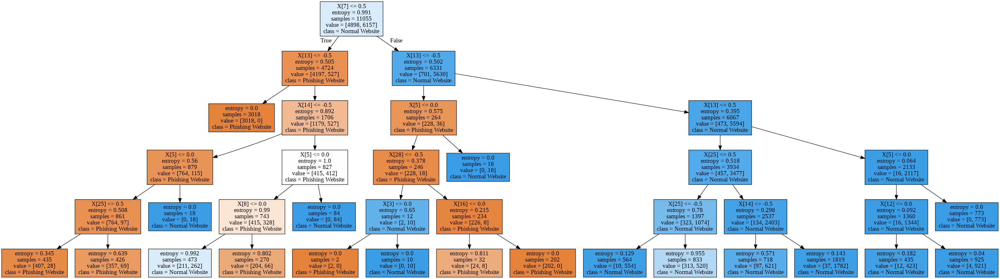

In [130]:
graph=pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())

# Analyzing the model

In [132]:
def train_eval_pipeline(model,train_data,test_data,name):
  #Initialize Weights and Biases 
  wandb.init(project="Decision Tree Example Using Phishing Dataset", name=name)
  #segregate the datasets
  (x_train,y_train)=train_data
  (x_test,y_test)=test_data
 
  # train and log all the necessary metrics
  start=time.time()
  model.fit(x_train,y_train)
  end=time.time()-start
  prediction=model.predict(x_test)
  wandb.log({"accuracy": accuracy_score(y_test,prediction)*100.0,
             "precision": precision_recall_fscore_support(y_test,prediction,average='macro')[0],
             'recall': precision_recall_fscore_support(y_test,prediction,average='macro')[1],
             'Training_time':end})
  print("Accuracy score of the Decision Tree Classifier with default hyperparameter values {0:.2f}%"\
  .format(accuracy_score(y_test,prediction)*100.0))
  print('\n')
  print("---Classification report of the Decision Tree Classifier with default hyperparameter values----")
  print('\n')
  print(classification_report(y_test,prediction,target_names=['Phishing Websites','Normal Websites'])) 

In [133]:
train_eval_pipeline(clf, (x_train,y_train),(x_test,y_test),'Decision Tree Classifier')

Accuracy score of the Decision Tree Classifier with default hyperparameter values 93.31%


---Classification report of the Decision Tree Classifier with default hyperparameter values----


                   precision    recall  f1-score   support

Phishing Websites       0.97      0.88      0.92       974
  Normal Websites       0.91      0.97      0.94      1237

         accuracy                           0.93      2211
        macro avg       0.94      0.93      0.93      2211
     weighted avg       0.94      0.93      0.93      2211



We can  therefore see from the function created  that the default hyperparameter values produce an accuracy score of 93.31%. 

# Optimization of the model

We can improve upon the model using two methods:

1.   Increasing the max depth of our decision tree.
2.   Tuning the hyperparameters on Wandb.

# Increasing the Maximum Depth

Increasing the max depth of the tree can increase the accuracy of the decision tree, being cautious not to overfit the model.
We will set the max depths to 10 and then 15 to see if there is an improvement.


In [135]:
clf2=tree.DecisionTreeClassifier(criterion='entropy',max_depth=10)

In [136]:
clf2=clf2.fit(x,y)
clf2

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=10, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

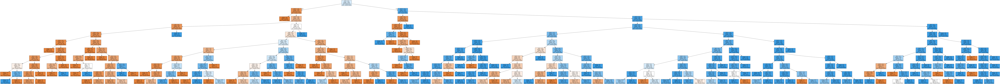

In [137]:
dot_data=tree.export_graphviz(clf2, class_names=['Phishing Website','Normal Website'],filled=True, out_file=None)
graph=pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())

In [138]:
train_eval_pipeline(clf2, (x_train,y_train),(x_test,y_test),'Decision Tree Classifier')

Accuracy score of the Decision Tree Classifier with default hyperparameter values 94.71%


---Classification report of the Decision Tree Classifier with default hyperparameter values----


                   precision    recall  f1-score   support

Phishing Websites       0.95      0.93      0.94       974
  Normal Websites       0.95      0.96      0.95      1237

         accuracy                           0.95      2211
        macro avg       0.95      0.95      0.95      2211
     weighted avg       0.95      0.95      0.95      2211



Our accuracy score for a max depth of 10 is 93.17%. This is 1.40% more than the max depth of 5

In [139]:
#Max Depth of 15

In [140]:
clf3=tree.DecisionTreeClassifier(criterion='entropy',max_depth=15)

In [141]:
clf3=clf3.fit(x,y)
clf3

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=15, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [142]:
dot_data=tree.export_graphviz(clf3, class_names=['Phishing Website','Normal Website'],filled=True, out_file=None)
graph=pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())

In [145]:
train_eval_pipeline(clf3, (x_train,y_train),(x_test,y_test),'Decision Tree Classifier')

Accuracy score of the Decision Tree Classifier with default hyperparameter values 96.34%


---Classification report of the Decision Tree Classifier with default hyperparameter values----


                   precision    recall  f1-score   support

Phishing Websites       0.96      0.96      0.96       974
  Normal Websites       0.97      0.97      0.97      1237

         accuracy                           0.96      2211
        macro avg       0.96      0.96      0.96      2211
     weighted avg       0.96      0.96      0.96      2211



The accuracy score when our max depth 15 is 96.34%. While this is higher than our max depth=5 model it is lower than our max depth = 10, which suggests that we are overfitting the model. Thus, the max depth = 10 will be used for further optimizations.

# Tuning the Hyperparameters using Random Search


In [144]:
#Import the GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

In [146]:
min_weight_fraction_leaf=[0.1,0.01,0.001]
max_depth=[3,10,30]
ccp_alpha=[0.1,0.01,0.001]
#Create a dictionary where tol and max_iteration are keys and the list of their
#values are the corresponding values. Key -> value
param_grid=dict(min_weight_fraction_leaf=min_weight_fraction_leaf,max_depth=max_depth,ccp_alpha=ccp_alpha)

In [147]:
#Instantiate RandomSearchCV with the required parameters
random_model=RandomizedSearchCV(estimator=clf2,param_distributions=param_grid,cv=5)

In [148]:
random_model_result=random_model.fit(x_train,y_train)
#summarized Results
best_score, best_params=random_model_result.best_score_, random_model_result.best_params_
print("Best score: %.2f using %s" %(best_score*100, best_params))

Best score: 93.25 using {'min_weight_fraction_leaf': 0.001, 'max_depth': 10, 'ccp_alpha': 0.001}


Using the hyperparameters 'min_weight_fraction_leaf': 0.01, 'max_depth': 10, 'ccp_alpha': 0.001 we achieve an accuracy score of 93.25%. While this is higher than our original model, it is still not higher than the model we created with a max depth of 10 and the default parameter

# Conclusion

In [148]:
Comparing both models, the Decision Tree produces a lower accuracy than the one created using the Logarithmic Regression method (93.71%). There is an decrease by 0.46.